# Detecção de Placas Veiculares utilizando Detectores de Bordas

Esse notebook se dispõem a demonstrar uma técnica para detecção automática de placas veiculares utilizando detecção de bordas com Sobel, seleção de contornos e código de cadeias com Teorema de Green e Aspect-Ratio para classificar possíveis candidatos.

São utilizadas imagens disponibilizadas pelo SSIG da UFMG.

O código será apresentado com base em uma divisão de etapas:
- Leitura das imagens do banco
- Pré processamento
- Detecção de Bordas
- Limiarização
- Operações com Matemática morfológica
- Seleção de Contornos
- Aproximação dos contornos e filtragem de candidatos com AR

Inicialmente o algoritmo será apresentado para uma única imagem. E logo após os parametrôs serão ajustados para detecção nas demais imagens da base.

#### Leitura das imagens do banco
As imagens lidas a seguir estão disponibilizada juntamente com esse notebook no GitHub

In [2]:
# Importação de bibliotecas OpenCV, MatplotLib e Numpy
import cv2 # biblioteca de visao computacional OpenCV
import numpy as np # biblioteca de manipulacao de vetores e ferramentas matematicas e cientificas Numpy
import matplotlib as mpl # biblioteca de manipulacao e exibicao de dados Matplotlib
from matplotlib import pyplot as plt # Pyplot: modulo do Matplotlib para exibir as imagens 
# utilizacao do matplotlib em formatacao para o Jupyter
%matplotlib inline 

In [3]:
# Carregando as imagens e convertendo para escala de cinza
path = '../Data/' # caminho para a pasta das imagens
img_color = [] # lista de imagens coloridas
img = [] # lista de imagens em tons de cinza
plt.figure(figsize=(15,8)) # definição do tamanho da janela de exibição das imagens
# A cada iteração uma imagem é carregada e convertida para tons de cinza, ao passo que é armazenada 
# nas listas acima 
for i in range(0,20): #A pasta data possui 20 imagens, i ira variar de 0 a 19
    # a identacao defini o escobo do laco FOR
    # a  funcao append() adiciona um elemento a lista
    # a funcao do OpenCV imread() realiza a leitura do arquivo de imagem
    # a funcao do OpenCV cvtColor() é usada para conversão de espaco de cores no caso RGB para GRAY
    img_color.append(cv2.imread(path + str(i+1) + '.png')) 
    img.append(cv2.cvtColor(img_color[i],cv2.COLOR_RGB2GRAY))  
    #Exibicao das imagens
    #plt.subplot(4,5,i+1) #Cria subplots na imagem que possuira 4 linhas e 5 colunas com elementos de 1 a 20
    #plt.imshow(img[i],cmap='gray') # Exibe a imagem com mapa de cores Gray
    #plt.xticks([]), plt.yticks([]) # Remove a exibição dos valores das dimensões das imagens nos eixos x e y

#### Pré processamento

A etapa de pré-processamento consistirá da redução do nível de ruído utilizando filtro de suavização mediano e equalização do histograma.

Para facilitar a visualização os passos a seguir serão demonstrados utilizando-se apenas uma única imagem.

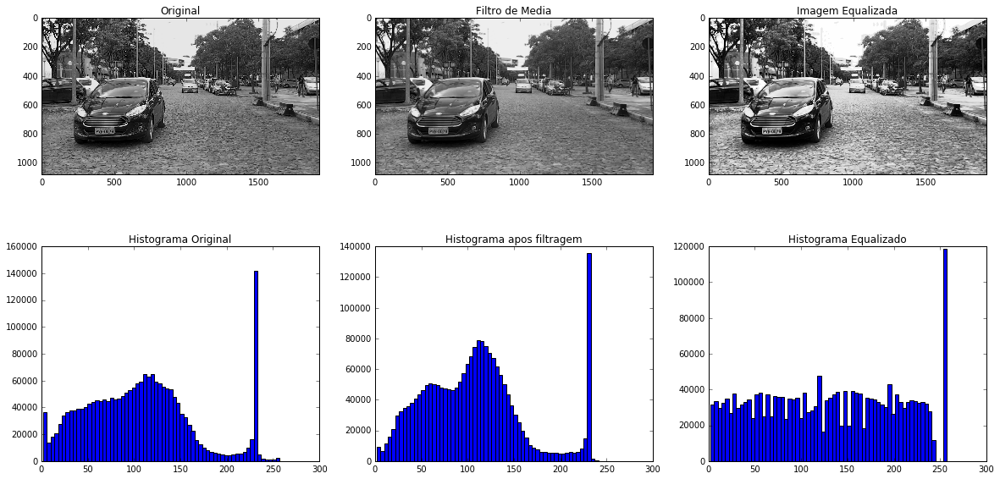

In [5]:
# Aplicação de filtro de Suavização e equalização de histograma
im = img[0]
mpl.rcParams['figure.figsize'] = (20.0, 10.0) #outra forma de definir as dimensões da janela do MatplotLib
# dessa forma esse valor fica fixo para todas as figuras geradas 
plt.subplot(2,3,1)
plt.imshow(im,cmap='gray')
plt.title('Original') # adiciona um titulo ao subplot

# Histograma
nbins = 64 # numero de barras do grafico de histograma
h, bin_edges = np.histogram(im.ravel(), nbins,(0,255)) # a funcao ravel() transforma a imagem em um vetor 1D
# apos calculo do histograma pela funcao histogram, prepara-se para desenhar o histograma atraves do plt.bar
w=256./nbins
bin_centers = bin_edges[1:]-(w/2)
plt.subplot(2,3,4)
plt.bar(bin_centers, h, width=w)
plt.title('Histograma Original')

# Filtros espaciais de suavização
plt.subplot(2,3,2)
#im = cv2.medianBlur(im,5) #mediana
im = cv2.blur(im,(5,5)) #média
#im = cv2.bilateralFilter(im,5,20,20) #bilateral
plt.imshow(im,cmap='gray')
plt.title('Filtro de Media')

# Histograma
h, bin_edges = np.histogram(im.ravel(), nbins,(0,255))
bin_centers = bin_edges[1:]-(w/2)
plt.subplot(2,3,5)
plt.bar(bin_centers, h, width=w)
plt.title('Histograma apos filtragem')

# Equalização
plt.subplot(2,3,3)
im = cv2.equalizeHist(im)
plt.imshow(im,cmap='gray')
plt.title('Imagem Equalizada')

#Histograma
h, bin_edges = np.histogram(im.ravel(), nbins,(0,255))
bin_centers = bin_edges[1:]-(w/2)
plt.subplot(2,3,6)
plt.bar(bin_centers, h, width=w)
plt.title('Histograma Equalizado')


#### Detecção de Bordas

Para detectar as bordas iremos comparar algumas abordagens:

- Filtro de aguçamento Laplaciano
- Filtro de aguçamento Prewitt
- Filtro de aguçamento Sobel
- Filtro de Canny
- Gradiente Morfológico

(<matplotlib.axes._subplots.AxesSubplot at 0x7fba86715690>,
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

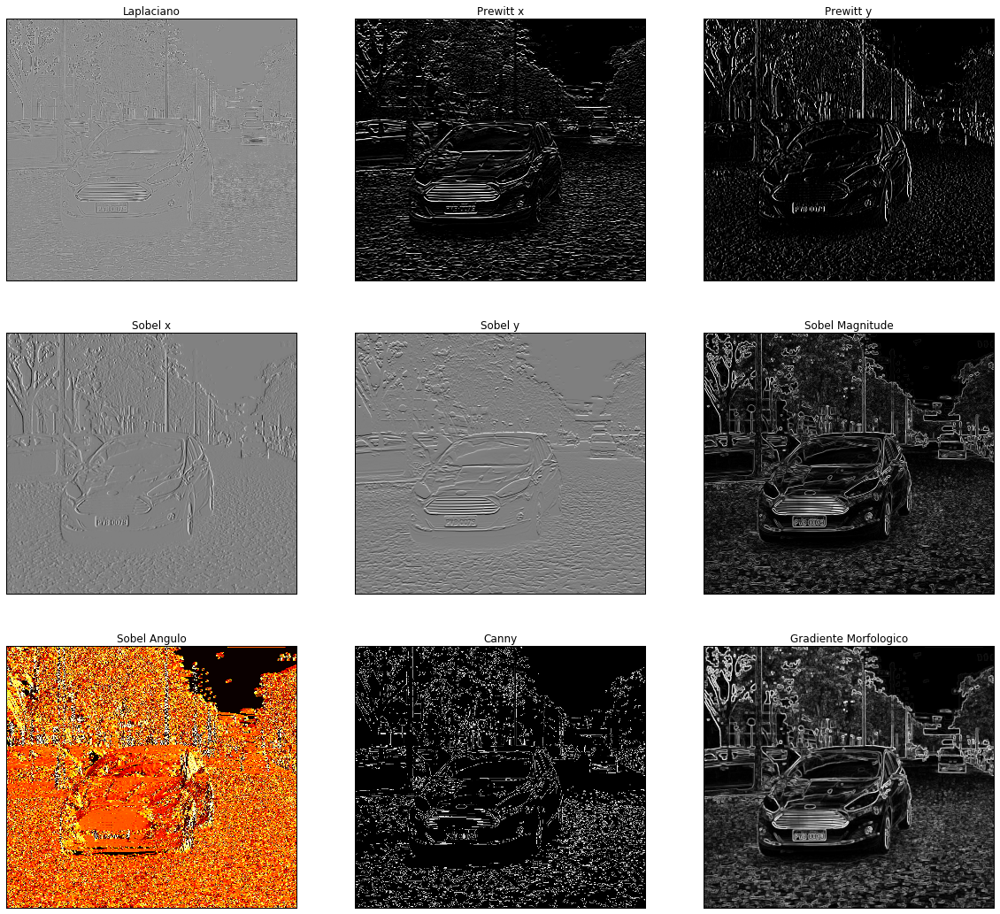

In [6]:
# Filtro Laplaciano
laplacian = cv2.Laplacian(im,cv2.CV_64F)
laplacian = cv2.normalize(laplacian, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)

# Filtro de Prewitt
kernelx = np.array([[1,1,1],[0,0,0],[-1,-1,-1]]) # filtro de Prewitt eixo x
kernely = np.array([[-1,0,1],[-1,0,1],[-1,0,1]]) # filtro de Prewitt eixo y
img_prewittx = cv2.filter2D(im, -1, kernelx)
img_prewitty = cv2.filter2D(im, -1, kernely)

# Filtro de Sobel
sobelx = cv2.Sobel(im,cv2.CV_64F,1,0,ksize=5) # filtro de sobel eixo x
sobely = cv2.Sobel(im,cv2.CV_64F,0,1,ksize=5) # filtro de sobel eixo y
sobel_mag = (sobelx**2 + sobely**2)**0.5  # magnitude de Sobel
sobel_ang = np.rad2deg(np.angle(sobelx+sobely*1j)) # angulo das bordas de Sobel
sobel_ang = (sobel_ang >= 0)*sobel_ang + (sobel_ang < 0)*(sobel_ang + 180) # angulos entre 0 e 180
sobel_ang = (sobel_ang < 180)*sobel_ang # angulo de 180 = angulo 0

sobelx = cv2.normalize(sobelx, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
sobely = cv2.normalize(sobely, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
sobel_mag = cv2.normalize(sobel_mag, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
sobel_ang = cv2.normalize(sobel_ang, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)

# Filtro de Canny
img_canny = cv2.Canny(im,100,200)

# Gradiente Morfológico
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(5,5))
morphg = cv2.morphologyEx(im, cv2.MORPH_GRADIENT, kernel)

#Plots
mpl.rcParams['figure.figsize'] = (20.0, 18.0) #dimensões da janela do MatplotLib
plt.subplot(3,3,1), plt.imshow(laplacian[:,0:1200],cmap = 'gray'), plt.title('Laplaciano'), plt.xticks([]), plt.yticks([])
plt.subplot(3,3,2), plt.imshow(img_prewittx[:,0:1200],cmap = 'gray'), plt.title('Prewitt x'), plt.xticks([]), plt.yticks([])
plt.subplot(3,3,3), plt.imshow(img_prewitty[:,0:1200],cmap = 'gray'), plt.title('Prewitt y'), plt.xticks([]), plt.yticks([])
plt.subplot(3,3,4), plt.imshow(sobelx[:,0:1200],cmap = 'gray'), plt.title('Sobel x'), plt.xticks([]), plt.yticks([])
plt.subplot(3,3,5), plt.imshow(sobely[:,0:1200],cmap = 'gray'), plt.title('Sobel y'), plt.xticks([]), plt.yticks([])
plt.subplot(3,3,6), plt.imshow(sobel_mag[:,0:1200],cmap = 'gray'), plt.title('Sobel Magnitude'), plt.xticks([]), plt.yticks([])
plt.subplot(3,3,7), plt.imshow(sobel_ang[:,0:1200],cmap = 'hot'), plt.title('Sobel Angulo'), plt.xticks([]), plt.yticks([])
plt.subplot(3,3,8), plt.imshow(img_canny[:,0:1200],cmap = 'gray'), plt.title('Canny'), plt.xticks([]), plt.yticks([])
plt.subplot(3,3,9), plt.imshow(morphg[:,0:1200],cmap = 'gray'), plt.title('Gradiente Morfologico'), plt.xticks([]), plt.yticks([])
# a imagem foi cortada para facilitar a visualização

Observou-se que os artigos em geral utilizam o filtro de Sobel nessa etapa. Deste modo, vamos utilizá-los para as próximas etapas. A etapa a seguir consiste em uma segmentação desse filtro de modo a remover as bordas menos acentuadas. 

(<matplotlib.axes._subplots.AxesSubplot at 0x7fba869dde10>,
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

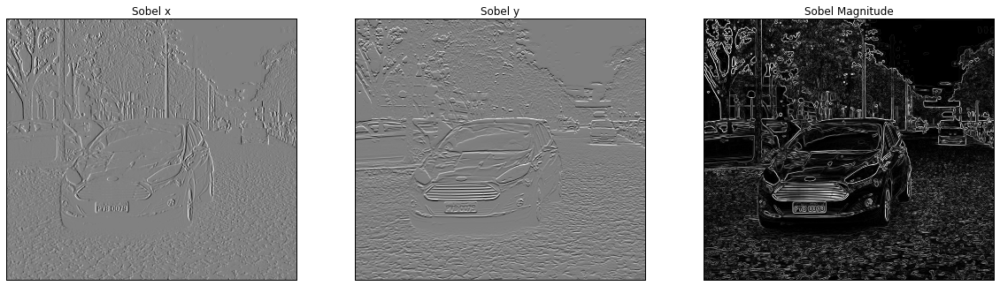

In [7]:
mpl.rcParams['figure.figsize'] = (20.0, 20.0) #dimensões da janela do MatplotLib
plt.subplot(1,3,1), plt.imshow(sobelx[:,0:1200],cmap = 'gray'), plt.title('Sobel x'), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,2), plt.imshow(sobely[:,0:1200],cmap = 'gray'), plt.title('Sobel y'), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,3), plt.imshow(sobel_mag[:,0:1200],cmap = 'gray'), plt.title('Sobel Magnitude'), plt.xticks([]), plt.yticks([])

#### Limiarização

Apesar de terem sido segmentadas as imagens, elas possuem mais de um nível de cinza. Uma vez que para o método realizado ela mantém os valores de cinza acima do clip.

Para os processos subsequentes entretanto é preferível o uso de imagens binarizada, por isso será aplicado uma segmentação em dois níveis da imagem. Inicialmente vamos fazer um teste empírico determinar o melhor limiar. Em seguida, plotaremos o histograma da imagem para descobrir se o valor selecionado como limiar é interessante. E,  por fim, comparar com o uso de threshold adaptativo e método de Otsu. 

- Metódo empírico

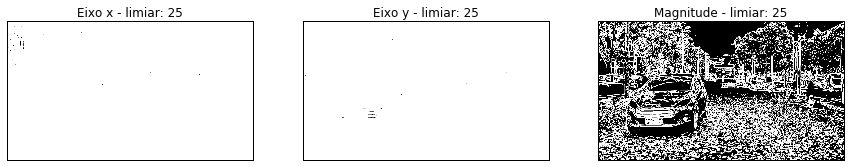

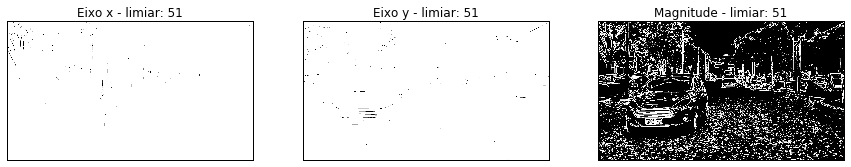

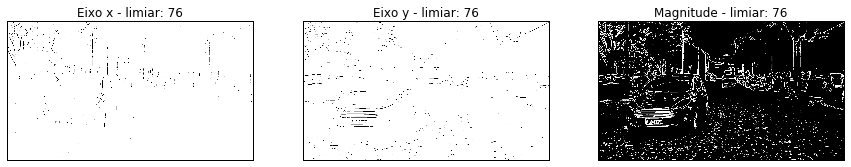

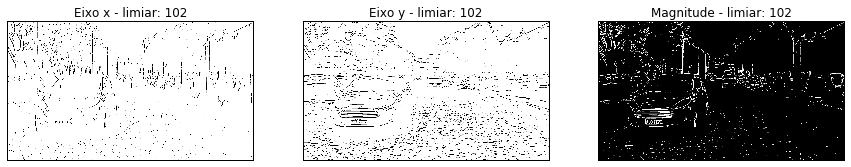

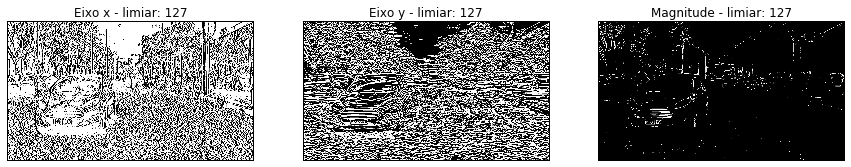

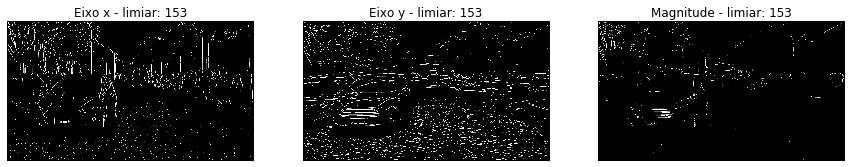

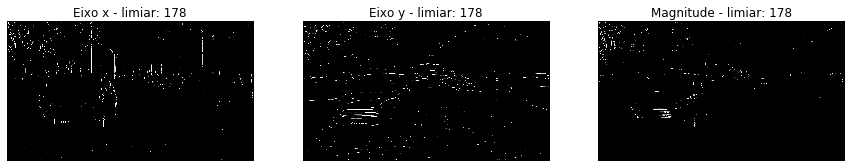

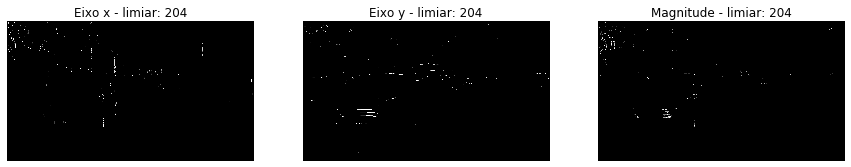

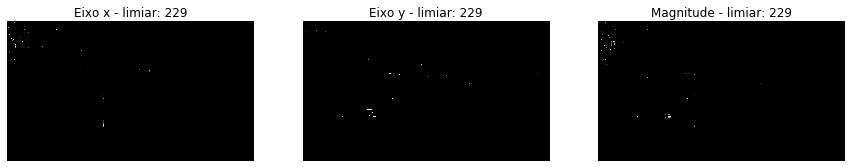

In [7]:
for i in range(1,10):
    limiar = int(255*i/10.0)
    _,xthr = cv2.threshold(sobelx,limiar,255,cv2.THRESH_BINARY)
    _,ythr = cv2.threshold(sobely,limiar,255,cv2.THRESH_BINARY)
    _,mthr = cv2.threshold(sobel_mag,limiar,255,cv2.THRESH_BINARY)
    
    plt.figure(figsize=(15,10))
    plt.subplot(1,3,1), plt.imshow(xthr,cmap='gray'), plt.title("Eixo x - limiar: "+ str(limiar)), plt.xticks([]), plt.yticks([])
    plt.subplot(1,3,2), plt.imshow(ythr,cmap='gray'), plt.title("Eixo y - limiar: "+ str(limiar)), plt.xticks([]), plt.yticks([])
    plt.subplot(1,3,3), plt.imshow(mthr,cmap='gray'), plt.title("Magnitude - limiar: "+ str(limiar)), plt.xticks([]), plt.yticks([])

(<matplotlib.axes._subplots.AxesSubplot at 0x7f7ee2259490>,
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

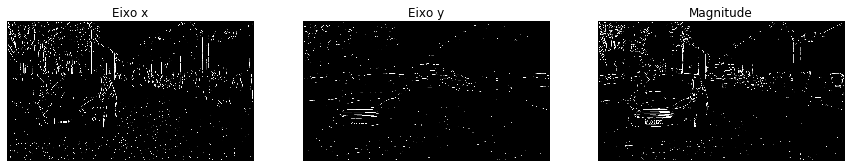

In [8]:
# Os valores de limiar foram determinados de forma empirica 178,150,115

_,xthr = cv2.threshold(sobelx,153,255,cv2.THRESH_BINARY)
_,ythr = cv2.threshold(sobely,178,255,cv2.THRESH_BINARY)
_,mthr = cv2.threshold(sobel_mag,115,255,cv2.THRESH_BINARY) # limiar ~= 255*0,45
plt.figure(figsize=(15,10))

plt.subplot(1,3,1), plt.imshow(xthr,cmap='gray'), plt.title("Eixo x"), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,2), plt.imshow(ythr,cmap='gray'), plt.title("Eixo y"), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,3), plt.imshow(mthr,cmap='gray'), plt.title("Magnitude"), plt.xticks([]), plt.yticks([])


- Histograma

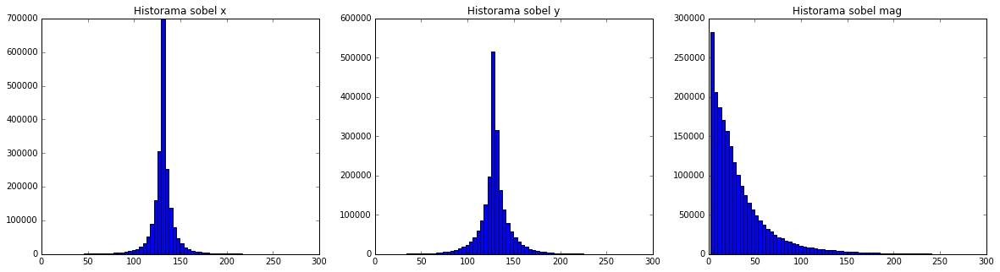

In [9]:
mpl.rcParams['figure.figsize'] = (20.0, 5.0) #dimensões da janela do MatplotLib

nbins = 64
h, bin_edges = np.histogram(sobelx, nbins,(0,255))
w=256./nbins
bin_centers = bin_edges[1:]-(w/2)
plt.subplot(1,3,1)
plt.bar(bin_centers, h, width=w)
plt.title('Historama sobel x')

nbins = 64
h, bin_edges = np.histogram(sobely, nbins,(0,255))
w=256./nbins
bin_centers = bin_edges[1:]-(w/2)
plt.subplot(1,3,2)
plt.bar(bin_centers, h, width=w)
plt.title('Historama sobel y')

nbins = 64
h, bin_edges = np.histogram(sobel_mag, nbins,(0,255))
w=256./nbins
bin_centers = bin_edges[1:]-(w/2)
plt.subplot(1,3,3)
plt.bar(bin_centers, h, width=w)
plt.title('Historama sobel mag')

Os histogramas acima não facilitam a determinação de um thresholding pois não apresenta dois picos com um vale entre eles, formato esse que facilita a escolha de um limiar. Entretanto, observa-se que o filtro de sobel leva a um acumulo de pontos com nível de cinza intermediário. Em nosso caso, esses pontos representam objetos indesejados na imagem como as bordas dos paralelepídedos presentes no chão.

- Otsu

(<matplotlib.axes._subplots.AxesSubplot at 0x7f7ee1d054d0>,
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

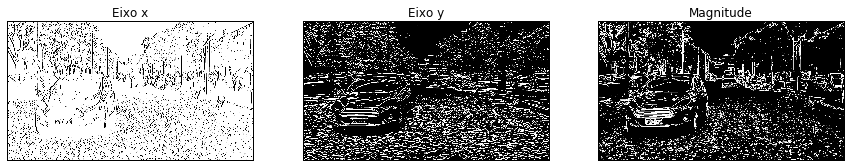

In [10]:
plt.figure(figsize=(15,10))

_,xthr = cv2.threshold(sobelx,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
_,ythr = cv2.threshold(sobely,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
_,mthr = cv2.threshold(sobel_mag,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

plt.subplot(1,3,1), plt.imshow(xthr,cmap='gray'), plt.title("Eixo x"), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,2), plt.imshow(ythr,cmap='gray'), plt.title("Eixo y"), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,3), plt.imshow(mthr,cmap='gray'), plt.title("Magnitude"), plt.xticks([]), plt.yticks([])

Aparentemente Otsu não apresenta as características encontradas com os thresholds experimentais. Entretanto, vale resaltar que o limiar empírico é obtido para um único caso, mas técnica como o Otsu podem servir para limiarizações automáticas.

- Métdos adaptativos

(<matplotlib.axes._subplots.AxesSubplot at 0x7f7ee2a6a850>,
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

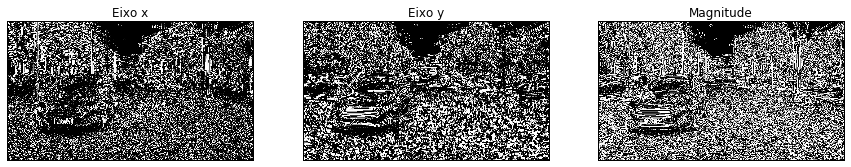

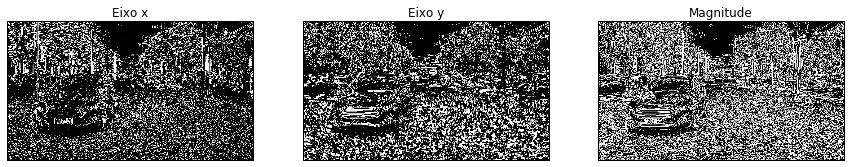

In [11]:
plt.figure(figsize=(15,10))

xthr = cv2.adaptiveThreshold(sobelx,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,3,0)
ythr = cv2.adaptiveThreshold(sobely,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,3,0)
mthr = cv2.adaptiveThreshold(sobel_mag,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,3,0)

plt.subplot(1,3,1), plt.imshow(xthr,cmap='gray'), plt.title("Eixo x"), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,2), plt.imshow(ythr,cmap='gray'), plt.title("Eixo y"), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,3), plt.imshow(mthr,cmap='gray'), plt.title("Magnitude"), plt.xticks([]), plt.yticks([])

plt.figure(figsize=(15,10))

xthr = cv2.adaptiveThreshold(sobelx,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,3,0)
ythr = cv2.adaptiveThreshold(sobely,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,3,0)
mthr = cv2.adaptiveThreshold(sobel_mag,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,3,0)

plt.subplot(1,3,1), plt.imshow(xthr,cmap='gray'), plt.title("Eixo x"), plt.title("Eixo x"), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,2), plt.imshow(ythr,cmap='gray'), plt.title("Eixo y"), plt.title("Eixo y"), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,3), plt.imshow(mthr,cmap='gray'), plt.title("Magnitude"), plt.title("Magnitude"), plt.xticks([]), plt.yticks([])

Os métodos adaptativos não apresentaram bons resultados. Vamos manter num primeiro momento os valores obtidos com o threshold obtidos empiricamente. Em seguida realizaremos testes com operadores morfológicos, objetivando a redução de ruídos e o destaque da região da placa.

(<matplotlib.axes._subplots.AxesSubplot at 0x7f9c144df810>,
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

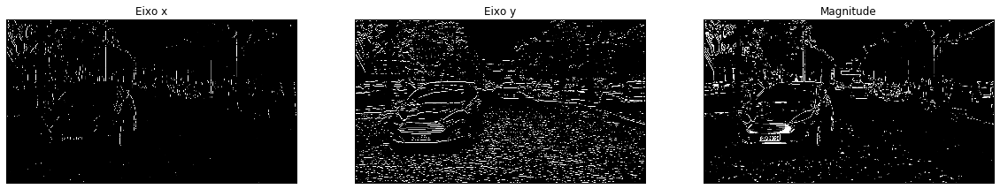

In [8]:
# Os valores de limiar foram determinados de forma empirica 178,150,115

_,xthr = cv2.threshold(sobelx,178,255,cv2.THRESH_BINARY)
_,ythr = cv2.threshold(sobely,153,255,cv2.THRESH_BINARY)
_,mthr = cv2.threshold(sobel_mag,115,255,cv2.THRESH_BINARY) # limiar ~= 255*0,45

plt.subplot(1,3,1), plt.imshow(xthr,cmap='gray'), plt.title("Eixo x"), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,2), plt.imshow(ythr,cmap='gray'), plt.title("Eixo y"), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,3), plt.imshow(mthr,cmap='gray'), plt.title("Magnitude"), plt.xticks([]), plt.yticks([])

#### Operações com Matemática morfológica

1. Operadores Básicos
    - Dilatação
    - Erosão


1. Outros operadores
    - Abertura
    - Fechamento
    - TopHat
    - Black Hat
    - Gradiente Morfológico

(([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

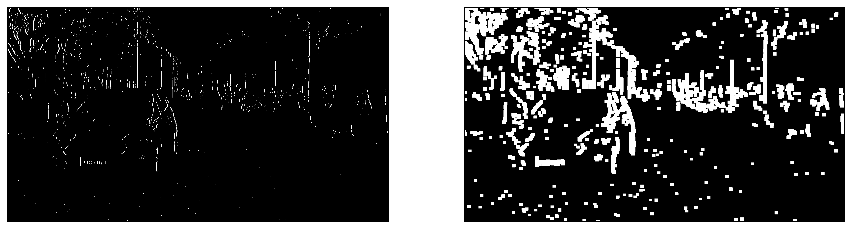

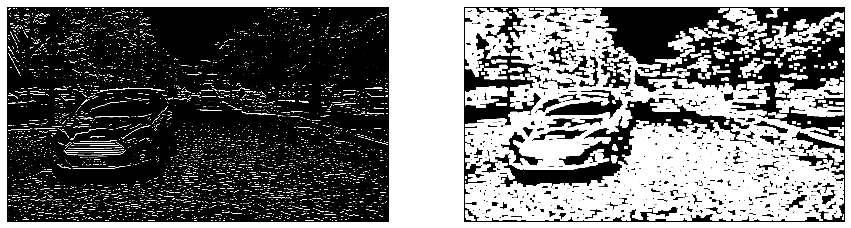

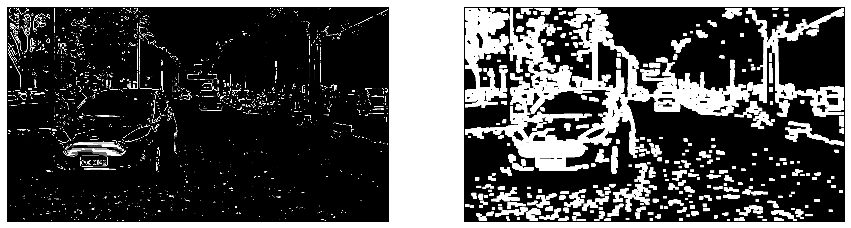

In [9]:
# Operadores básico
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(17,13)) # MORPH_RECT devido ao formato da placa 

#dilatação
morphDx = cv2.dilate(xthr,kernel,1)
morphDy = cv2.dilate(ythr,kernel,1)
morphDm = cv2.dilate(mthr,kernel,1)

#erosão
#morphEx = cv2.erode(xthr,kernel,1)
#morphEy = cv2.erode(thr_sobely,kernel,1)
#morphEm = cv2.erode(thr_sobel_mag,kernel,1)

mpl.rcParams['figure.figsize'] = (15.0, 10.0) #dimensões da janela do MatplotLib
plt.figure('Dilatacao 1')
plt.subplot(1,2,1),plt.imshow(xthr,cmap='gray'),#plt.title('Original x'), 
plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(morphDx,cmap='gray'),#plt.title('Dilatacao x'), 
plt.xticks([]), plt.yticks([])
plt.figure('Dilatacao 2')
plt.subplot(1,2,1),plt.imshow(ythr,cmap='gray'),#plt.title('Original y'), 
plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(morphDy,cmap='gray'),#plt.title('Dilatacao y'), 
plt.xticks([]), plt.yticks([])
plt.figure('Dilatacao 3')
plt.subplot(1,2,1),plt.imshow(mthr,cmap='gray'),#plt.title('Original mag'), 
plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(morphDm,cmap='gray'),#plt.title('Dilatacao mag'), 
plt.xticks([]), plt.yticks([])

(<matplotlib.axes._subplots.AxesSubplot at 0x7f9c0359f9d0>,
 <matplotlib.text.Text at 0x7f9c034dbfd0>)

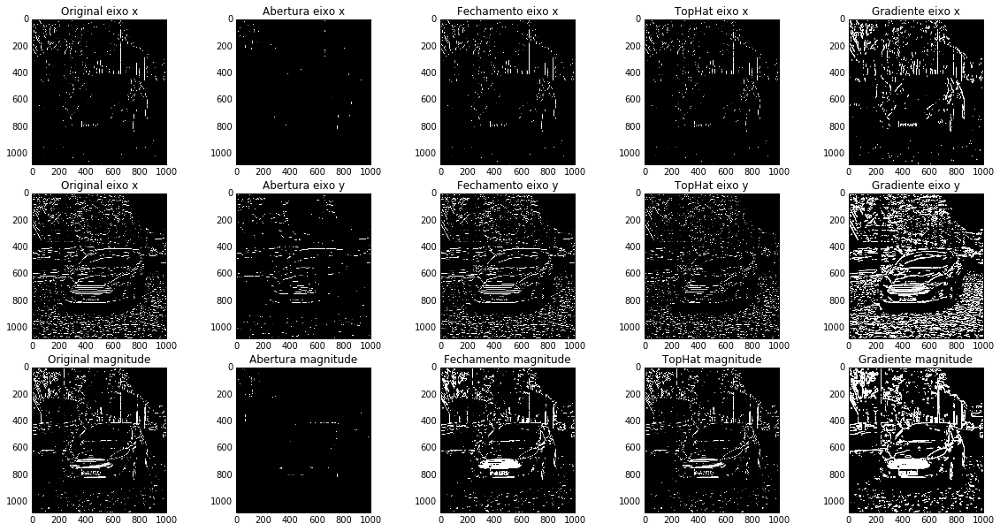

In [10]:
#Outros operadores
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(5,5)) # MORPH_RECT devido ao formato da placa 

#Abertura
morphAx = cv2.morphologyEx(xthr,cv2.MORPH_OPEN,kernel)
morphAy = cv2.morphologyEx(ythr,cv2.MORPH_OPEN,kernel)
morphAm = cv2.morphologyEx(mthr,cv2.MORPH_OPEN,kernel)

#Fechamento
morphFx = cv2.morphologyEx(xthr,cv2.MORPH_CLOSE,kernel)
morphFy = cv2.morphologyEx(ythr,cv2.MORPH_CLOSE,kernel)
morphFm = cv2.morphologyEx(mthr,cv2.MORPH_CLOSE,kernel)

#TopHat
morphTx = cv2.morphologyEx(xthr,cv2.MORPH_TOPHAT,kernel)
morphTy = cv2.morphologyEx(ythr,cv2.MORPH_TOPHAT,kernel)
morphTm = cv2.morphologyEx(mthr,cv2.MORPH_TOPHAT,kernel)

#Gradient Morfológico
morphGx = cv2.morphologyEx(xthr,cv2.MORPH_GRADIENT,kernel)
morphGy = cv2.morphologyEx(ythr,cv2.MORPH_GRADIENT,kernel)
morphGm = cv2.morphologyEx(mthr,cv2.MORPH_GRADIENT,kernel)

#plot
mpl.rcParams['figure.figsize'] = (20.0, 10.0) #dimensões da janela do MatplotLib

plt.subplot(3,5,1),plt.imshow(xthr[:,0:1000],cmap = 'gray'),plt.title('Original eixo x')
plt.subplot(3,5,2),plt.imshow(morphAx[:,0:1000],cmap = 'gray'),plt.title('Abertura eixo x')
plt.subplot(3,5,3),plt.imshow(morphFx[:,0:1000],cmap = 'gray'),plt.title('Fechamento eixo x')
plt.subplot(3,5,4),plt.imshow(morphTx[:,0:1000],cmap = 'gray'),plt.title('TopHat eixo x')
plt.subplot(3,5,5),plt.imshow(morphGx[:,0:1000],cmap = 'gray'),plt.title('Gradiente eixo x')

plt.subplot(3,5,6),plt.imshow(ythr[:,0:1000],cmap = 'gray'),plt.title('Original eixo x')
plt.subplot(3,5,7),plt.imshow(morphAy[:,0:1000],cmap = 'gray'),plt.title('Abertura eixo y')
plt.subplot(3,5,8),plt.imshow(morphFy[:,0:1000],cmap = 'gray'),plt.title('Fechamento eixo y')
plt.subplot(3,5,9),plt.imshow(morphTy[:,0:1000],cmap = 'gray'),plt.title('TopHat eixo y')
plt.subplot(3,5,10),plt.imshow(morphGy[:,0:1000],cmap = 'gray'),plt.title('Gradiente eixo y')

plt.subplot(3,5,11),plt.imshow(mthr[:,0:1000],cmap = 'gray'),plt.title('Original magnitude')
plt.subplot(3,5,12),plt.imshow(morphAm[:,0:1000],cmap = 'gray'),plt.title('Abertura magnitude')
plt.subplot(3,5,13),plt.imshow(morphFm[:,0:1000],cmap = 'gray'),plt.title('Fechamento magnitude')
plt.subplot(3,5,14),plt.imshow(morphTm[:,0:1000],cmap = 'gray'),plt.title('TopHat magnitude')
plt.subplot(3,5,15),plt.imshow(morphGm[:,0:1000],cmap = 'gray'),plt.title('Gradiente magnitude')


(<matplotlib.axes._subplots.AxesSubplot at 0x7f9c03ec8350>,
 <matplotlib.image.AxesImage at 0x7f9c033edb10>)

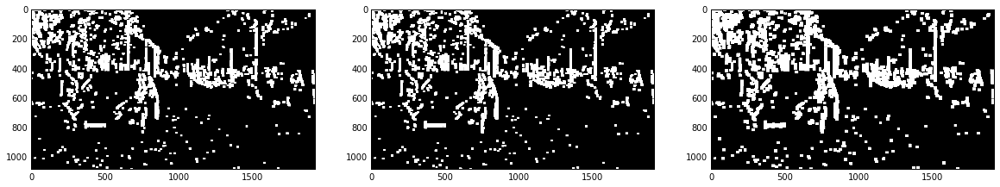

In [11]:
# Operadores básico
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(17,13)) # MORPH_RECT devido ao formato da placa 

#dilatação
morph = cv2.dilate(morphTx,kernel,1)
morphDx = cv2.dilate(xthr,kernel,1)
morphGra = cv2.dilate(morphGx,kernel,1)

plt.subplot(1,3,1), plt.imshow(morph,cmap='gray')
plt.subplot(1,3,2), plt.imshow(morphDx,cmap='gray')
plt.subplot(1,3,3), plt.imshow(morphGra,cmap='gray')




#### Seleção de Contornos

(<matplotlib.image.AxesImage at 0x7f9c032872d0>,
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

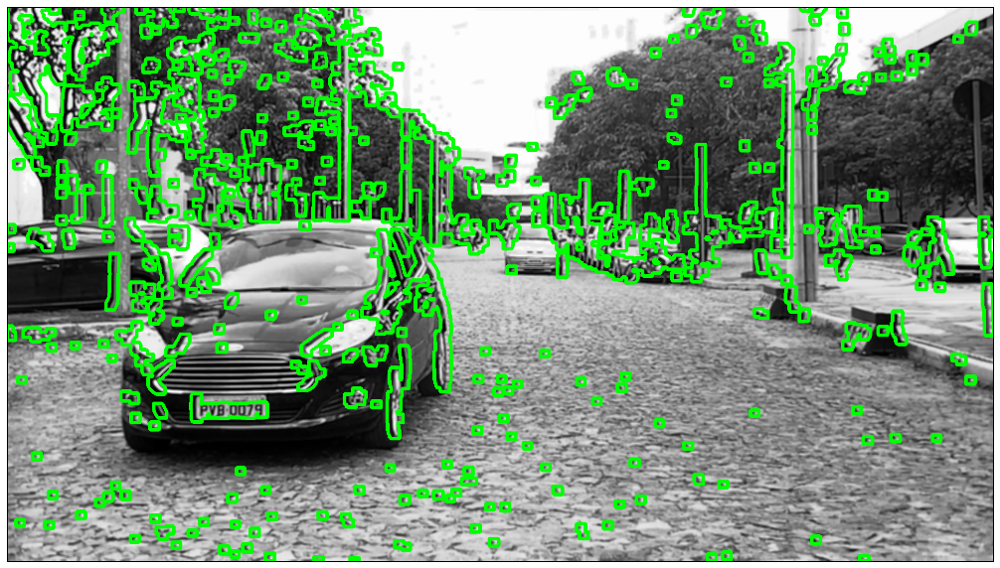

In [12]:
_,contours1, hierarch = cv2.findContours(morphDx, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
img_cont1 = cv2.cvtColor(im,cv2.COLOR_GRAY2BGR)
cv2.drawContours(img_cont1, contours1, -1, (0,255,0), 5)
plt.imshow(img_cont1,cmap='gray'),plt.xticks([]), plt.yticks([])

#### Aproximação dos contornos e filtragem de candidatos com AR

(<matplotlib.image.AxesImage at 0x7f9c03211b90>,
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

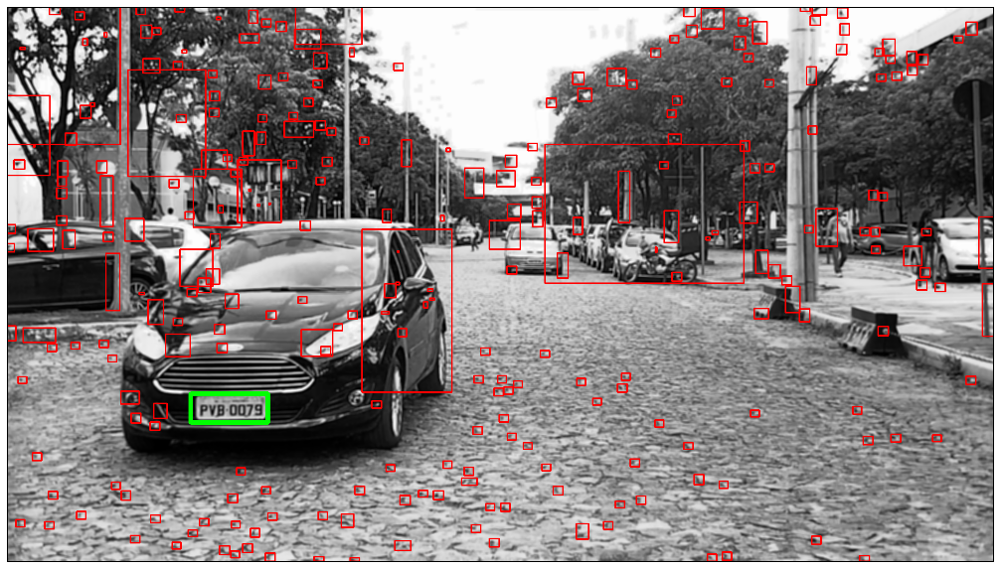

In [13]:
color = cv2.cvtColor(im,cv2.COLOR_GRAY2BGR)
for cnt in contours1:
    epsilon = 0.05*cv2.arcLength(cnt,True)
    approx = cv2.approxPolyDP(cnt,epsilon,True)
    #cv2.drawContours(color, approx,-1, (0,0,255), 10)
    if(len(approx) == 4):
        x,y,w,h = cv2.boundingRect(cnt)
        cv2.rectangle(color,(x,y),(x+w,y+h),(255,0,0),2)
        ar = 1.0*h/w
        #cv2.putText(color,str(round(ar, 2)),(x,y),cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,0,255), 2)
        if(ar >= 0.3 and ar <= 0.4 and h*w >= 2300 and h*w <= 23000):
            cv2.rectangle(color,(x,y),(x+w,y+h),(0,255,0),8)  
plt.imshow(color,cmap='gray'),plt.xticks([]), plt.yticks([])

## Aplicação em todas as imagens

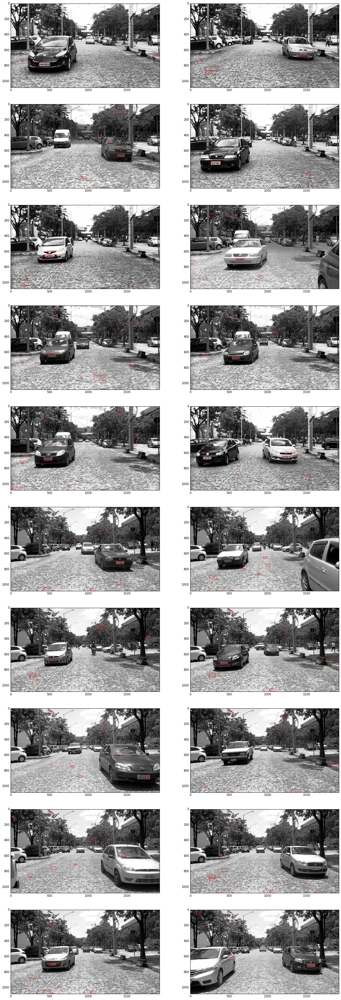

In [18]:
mpl.rcParams['figure.figsize'] = (20.0, 60.0) #dimensões da janela do MatplotLib
for i in range(0,20):
    im = img[i]
    im = cv2.blur(im,(5,5))
    im = cv2.equalizeHist(im)
    sobelx = cv2.Sobel(im,cv2.CV_64F,1,0,ksize=5) # filtro de sobel eixo x
    sobelx = cv2.normalize(sobelx, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    _,xthr = cv2.threshold(sobelx,153,255,cv2.THRESH_BINARY)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(17,13)) # MORPH_RECT devido ao formato da placa 
    morphDx = cv2.dilate(xthr,kernel,1)
    _,contours1, hierarch = cv2.findContours(morphDx, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    img_cont1 = cv2.cvtColor(im,cv2.COLOR_GRAY2BGR)
    color = cv2.cvtColor(im,cv2.COLOR_GRAY2BGR)
    for cnt in contours1:
        epsilon = 0.05*cv2.arcLength(cnt,True)
        approx = cv2.approxPolyDP(cnt,epsilon,True)
        if(len(approx) >= 4):
            x,y,w,h = cv2.boundingRect(cnt)
            #cv2.rectangle(color,(x,y),(x+w,y+h),(0,255,0),1)
            ar = 1.0*h/w
            #cv2.putText(color,str(round(ar, 2)),(x,y),cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,0,255), 2)
            if(ar >= 0.3 and ar <= 0.45):
                cv2.rectangle(color,(x,y),(x+w,y+h),(255,0,0),2)  
    plt.subplot(10,2,i+1)
    plt.imshow(color,cmap='gray')